In [26]:
import sys

sys.path.append('D:/geomfum')
import geomstats.backend as gs

from geomfum.dataset import NotebooksDataset
from geomfum.descriptor.pipeline import (
    ArangeSubsampler,
    DescriptorPipeline,
    L2InnerNormalizer,
)
from geomfum.descriptor.spectral import WaveKernelSignature
from geomfum.forward_functional_map import ForwardFunctionalMap
from geomfum.shape import TriangleMesh


In [27]:
dataset = NotebooksDataset()
path = dataset.get_filename("cat-00") #Here you should use the path to your mesh file
path_a = r"d:\Z_DATA\FAUST_shapes_off\tr_reg_080.off"
path_b = r"d:\Z_DATA\FAUST_shapes_off\tr_reg_090.off"
#mesh_a = TriangleMesh.from_file(dataset.get_filename("cat-00"))
#mesh_b = TriangleMesh.from_file(dataset.get_filename("lion-00"))
mesh_a = TriangleMesh.from_file(path_a)
mesh_b = TriangleMesh.from_file(path_b)


INFO: Data has already been downloaded... using cached file ('C:\Users\LONGA\.geomfum\data\cat-00.off').


In [28]:
k = 120
mesh_a.laplacian.find_spectrum(spectrum_size=k, set_as_basis=True)
mesh_b.laplacian.find_spectrum(spectrum_size=k, set_as_basis=True)

(array([-1.35932932e-14,  3.11410431e+00,  3.84641265e+00,  6.14592994e+00,
         8.86314230e+00,  1.20249746e+01,  2.36277199e+01,  2.38126030e+01,
         3.46883558e+01,  3.60095838e+01,  4.54336795e+01,  5.02514184e+01,
         5.52420382e+01,  6.78605763e+01,  7.17770065e+01,  8.04347667e+01,
         8.90348009e+01,  1.04565791e+02,  1.23156516e+02,  1.31840927e+02,
         1.35237888e+02,  1.41914297e+02,  1.45564077e+02,  1.51662706e+02,
         1.56633718e+02,  1.67501951e+02,  1.71552061e+02,  1.79588159e+02,
         1.85163433e+02,  1.87779061e+02,  1.96136978e+02,  2.11426673e+02,
         2.19395005e+02,  2.20564532e+02,  2.23848574e+02,  2.24451663e+02,
         2.29091353e+02,  2.48001197e+02,  2.56635674e+02,  2.64309845e+02,
         2.72107517e+02,  2.76240856e+02,  2.78487295e+02,  2.83390232e+02,
         2.97923093e+02,  2.99944870e+02,  3.10714067e+02,  3.13332929e+02,
         3.21894047e+02,  3.25790061e+02,  3.30641929e+02,  3.32157797e+02,
         3.3

In [29]:
#mesh_a.landmark_indices = gs.array([2840, 1594, 5596, 6809, 3924, 7169])
#mesh_b.landmark_indices = gs.array([1334, 834, 4136, 4582, 3666, 4955])
### FAUST ### 

mesh_a.landmark_indices = gs.array([1, 10, 100, 1000, 500, 2000])
mesh_b.landmark_indices = gs.array([1, 10, 100, 1000, 500, 2000])

steps = [
    WaveKernelSignature.from_registry(n_domain=200, use_landmarks=True),
    ArangeSubsampler(subsample_step=1),
    L2InnerNormalizer(),
]

pipeline = DescriptorPipeline(steps)

descr_a = pipeline.apply(mesh_a)
descr_b = pipeline.apply(mesh_b)

In [30]:
from geomfum.plot import MeshPlotter
PLOT_TYPE = "plotly"
plotter_a = MeshPlotter.from_registry(which=PLOT_TYPE)
plotter_a.add_mesh(mesh_a)
plotter_b = MeshPlotter.from_registry(which=PLOT_TYPE)
plotter_b.add_mesh(mesh_b)
plotter_a.colormap = plotter_b.colormap = "viridis"
plotter_a.set_vertex_scalars(descr_a[0])
plotter_a.show()
plotter_b.set_vertex_scalars(descr_b[0])
plotter_b.show()

In [31]:
import numpy as np


def compute_CMH(shape, basis):
   
    error = shape.vertices - basis @ basis.T @ shape.laplacian.mass_matrix @ shape.vertices

    CMH = basis.copy()

    for i in range(3):
        col = error[:, i]
        Mcmh = col - CMH @ CMH.T @ shape.laplacian.mass_matrix @ col
        norm_factor = np.sqrt(Mcmh.T @ shape.laplacian.mass_matrix @ Mcmh)
        Mcmh = Mcmh / norm_factor
        CMH = np.column_stack((CMH, Mcmh))

    return CMH

In [32]:
CMH_test_a = compute_CMH(mesh_a, mesh_a.basis.vecs[:,:50])
CMH_test_b = compute_CMH(mesh_b, mesh_b.basis.vecs[:,:50])

In [33]:
from geomfum.plot import MeshPlotter

plotter = MeshPlotter.from_registry(colormap="RdBu", which="plotly")

plotter.add_mesh(mesh_a)

plotter.set_vertex_scalars(CMH_test_a[:, 50])
plotter.show()
plotter.set_vertex_scalars(CMH_test_a[:, 51])
plotter.show()
plotter.set_vertex_scalars(CMH_test_a[:, 52])
plotter.show()

In [34]:

plotter = MeshPlotter.from_registry(colormap="RdBu", which="plotly")

plotter.add_mesh(mesh_b)

plotter.set_vertex_scalars(CMH_test_b[:, 50])
plotter.show()
plotter.set_vertex_scalars(CMH_test_b[:, 51])
plotter.show()
plotter.set_vertex_scalars(CMH_test_b[:, 52])
plotter.show()

In [35]:
from geomfum.functional_map import (
    FactorSum,
    LBCommutativityEnforcing,
    OperatorCommutativityEnforcing,
    SpectralDescriptorPreservation,
)
from geomfum.numerics.optimization import ScipyMinimize
from geomfum.basis import EigenBasis, CmhEigenBasis


In [36]:
mesh_a.basis.use_k = 50
mesh_b.basis.use_k = 50

In [37]:
type(mesh_a.basis.vals)

numpy.ndarray

In [38]:
test_array_a  = np.concatenate((mesh_a.basis.vals[:50], np.zeros(3)))
test_array_b = np.concatenate((mesh_b.basis.vals[:50], np.zeros(3)))

In [39]:
CHM_bas_a = CmhEigenBasis(mesh_a, test_array_a, CMH_test_a, use_k = CMH_test_a.shape[1])
CHM_bas_b = CmhEigenBasis(mesh_b, test_array_b, CMH_test_b, use_k = CMH_test_b.shape[1])

In [40]:
#CHM_bas_a = mesh_a.basis
#CHM_bas_b = mesh_b.basis

In [41]:
import geomfum.linalg as la
factors = [
    SpectralDescriptorPreservation(
        la.matvecmul(
            CHM_bas_a.vecs.T,
            la.matvecmul(mesh_a.laplacian.mass_matrix, descr_a),
        ),
        la.matvecmul(
            CHM_bas_b.vecs.T,
            la.matvecmul(mesh_b.laplacian.mass_matrix, descr_b),
        ),
        weight=1e-1,
    ),
    LBCommutativityEnforcing.from_bases(
        CHM_bas_a,
        CHM_bas_b,
        weight=1e-3,
    ),
    OperatorCommutativityEnforcing.from_multiplication(
        CHM_bas_a, descr_a, CHM_bas_b, descr_b, weight=1
    ),
]

In [42]:
objective = FactorSum(factors)

optimizer = ScipyMinimize(
    method="L-BFGS-B",
)

x0 = gs.zeros((CHM_bas_b.spectrum_size, CHM_bas_a.spectrum_size))

res = optimizer.minimize(
    objective,
    x0,
    fun_jac=objective.gradient,
)

fmap = res.x.reshape(x0.shape)


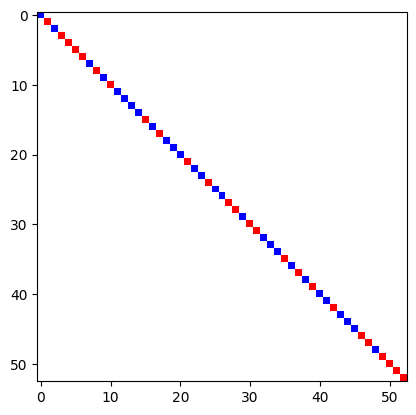

In [43]:
import matplotlib.pyplot as plt

plt.imshow(fmap[:53,:53], "bwr")
#plt.imshow(fmap[-3:,-3:], "bwr")

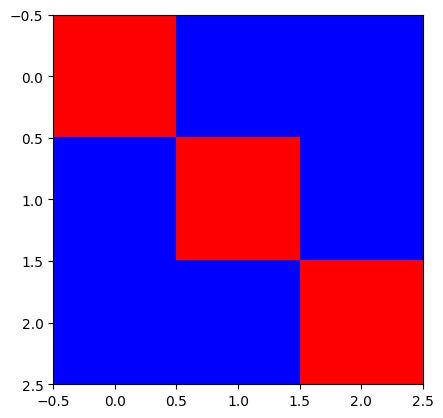

In [44]:
plt.imshow(fmap[-3:,-3:], "bwr")

In [45]:
#ffm = ForwardFunctionalMap(lmbda=1e3, resolvent_gamma=1)
#fmap, fmap21 = ffm(mesh_a, mesh_b, descr_a, descr_b)

In [46]:
#import matplotlib.pyplot as plt
#plt.imshow(fmap[:53,:53], "bwr")


In [47]:
from geomfum.convert import P2pFromFmConverter

p2p_converter = P2pFromFmConverter()

p2p = p2p_converter(fmap[:53,:53], CHM_bas_a, CHM_bas_b)

In [48]:
PLOT_TYPE = "plotly"

plotter_a = MeshPlotter.from_registry(which=PLOT_TYPE)
plotter_a.add_mesh(mesh_a)


plotter_b = MeshPlotter.from_registry(which=PLOT_TYPE)
plotter_b.add_mesh(mesh_b)


scalar_a = gs.mean(mesh_a.vertices, axis=-1)
plotter_a.set_vertex_scalars(scalar_a)
plotter_a.show()

plotter_b.add_mesh(mesh_b)
plotter_b.set_vertex_scalars(scalar_a[p2p])
plotter_b.show()


### ZOOMOUT

In [49]:
from geomfum.refine import ZoomOut

In [50]:
fmap.shape

(53, 53)

In [51]:
zoomout = ZoomOut(nit=6, step=5)

zoomout_fmap_matrix_ = zoomout(fmap[:53,:53], CHM_bas_a, CHM_bas_b)
p2p_ref = p2p_converter(zoomout_fmap_matrix_, CHM_bas_a, CHM_bas_b)

ValueError: Not enough eigenvectors on `basis_a`, `basis_b`.

In [ ]:
plt.imshow(zoomout_fmap_matrix_, cmap="bwr")

In [ ]:
plt.imshow(zoomout_fmap_matrix_[-3:,-3:], cmap="bwr")

In [ ]:
scalar_a = gs.mean(mesh_a.vertices, axis=-1)

plotter_a.set_vertex_scalars(scalar_a)
plotter_a.show()

plotter_b.add_mesh(mesh_b)
plotter_b.set_vertex_scalars(scalar_a[p2p_ref])
plotter_b.show()
